<a href="https://colab.research.google.com/github/hafsahhannah/Image-Classification/blob/main/image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import packages

import os
import datetime
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers,optimizers,losses,metrics,callbacks,applications
from keras import Sequential, Model
from keras.utils import image_dataset_from_directory, plot_model
from keras.applications.mobilenet_v2 import preprocess_input, MobileNetV2
from keras.layers import RandomFlip, RandomRotation, RandomZoom
from keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from keras.callbacks import EarlyStopping, TensorBoard, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import classification_report

In [2]:
#%% 1. Data loading

# Thank you sir Warren for showing the ways on how to download the dataset :-)

# Download the dataset
!wget https://prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com/5y9wdsg2zt-2.zip

# Unzip and extract into a dataset file
!unzip "5y9wdsg2zt-2.zip"


--2023-01-11 02:43:52--  https://prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com/5y9wdsg2zt-2.zip
Resolving prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com)... 52.218.84.19, 52.218.112.104, 52.218.57.216, ...
Connecting to prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com)|52.218.84.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 240847944 (230M) [application/octet-stream]
Saving to: ‘5y9wdsg2zt-2.zip’

5y9wdsg2zt-2.zip    100%[===================>] 229.69M  20.6MB/s    in 12s     

2023-01-11 02:44:05 (18.6 MB/s) - ‘5y9wdsg2zt-2.zip’ saved [240847944/240847944]

Archive:  5y9wdsg2zt-2.zip
  inflating: Concrete Crack Images for Classification.rar  


In [3]:
!pip install unrar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [11]:
!unrar x "/content/Concrete Crack Images for Classification.rar" "/content/sample_data/dataset"

Streaming output truncated to the last 5000 lines.
Extracting  /content/sample_data/dataset/Negative/15002.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15003.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15004.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15005.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15006.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15007.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15008.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15009.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15010.jpg               88%  OK 
Extracting  /content/sample_data/dataset/Negative/15011.jpg               88%  OK 
Extracting  /content/sample_d

In [12]:
DATASET_PATH = os.path.join(os.getcwd(), 'sample_data', 'dataset')
IMAGE_SIZE = (128, 128)
BATCH_SIZE = 64
SEED = 12345

In [14]:
# Load the dataset as a tensorflow dataset

train_ds = image_dataset_from_directory(DATASET_PATH, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, seed=SEED, validation_split=0.2, subset='training')

val_ds = image_dataset_from_directory(DATASET_PATH, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE, seed=SEED, validation_split=0.2, subset='validation')

Found 40000 files belonging to 2 classes.
Using 32000 files for training.
Found 40000 files belonging to 2 classes.
Using 8000 files for validation.


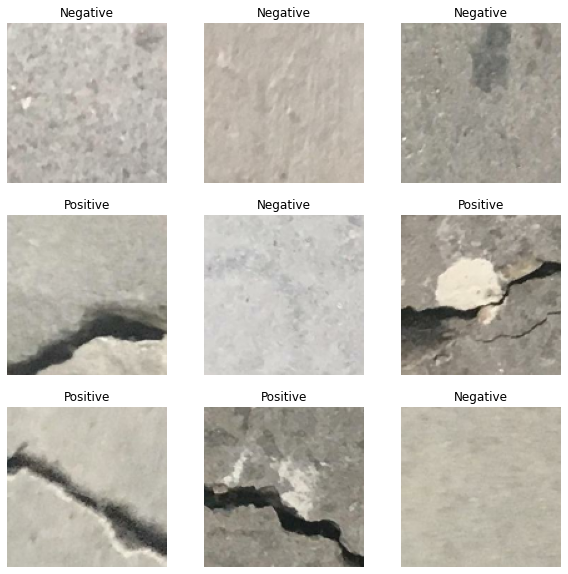

In [15]:
#%% 2. Data inspection

CLASS_NAME = train_ds.class_names

# Ensure that images are propely loaded

plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
    for i in range(9):
        plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype(np.uint8))
        plt.title(CLASS_NAME[labels[i]])
        plt.axis(False)
plt.show()

In [16]:
#%% 3. Data preparation
# Validation test split for batches dataset

batches = tf.data.experimental.cardinality(val_ds)
test_ds = val_ds.take(batches // 2)
val_ds = val_ds.skip(batches // 2)

In [17]:
print('Number of validation batches: %d' % tf.data.experimental.cardinality(val_ds))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_ds))

Number of validation batches: 63
Number of test batches: 62


In [18]:
# Convert Batchdataset into PrefetchDataset

AUTOTUNE = tf.data.AUTOTUNE

train_pf = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_pf = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_pf = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [19]:
#%% Create a small pipeline for image augmentation

data_augmentation = keras.Sequential()
data_augmentation.add(layers.RandomFlip('horizontal'))
data_augmentation.add(layers.RandomRotation(0.2))


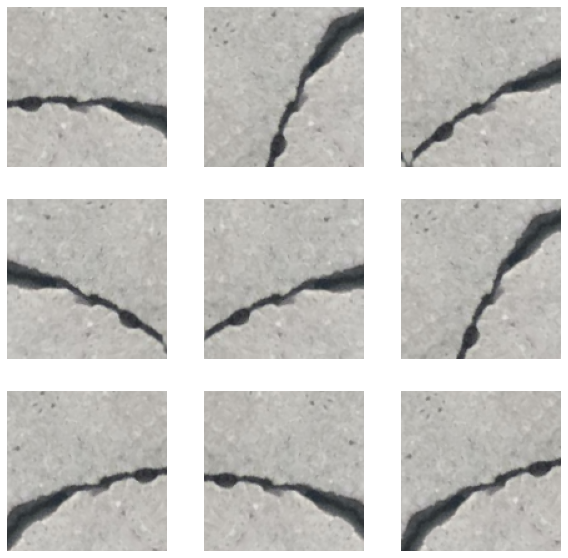

In [20]:
# Apply data augmentation on one image to test it out

for images,labels in train_ds.take(1):
    first_image = images[0]
    plt.figure(figsize=(10,10))
    for i in range(9):
        plt.subplot(3,3,i+1)
        augmented_image = data_augmentation(tf.expand_dims(first_image,axis=0))
        plt.imshow(augmented_image[0]/255.0)
        plt.axis('off')

In [21]:
#%% 4. Model development
# Apply transfer learning
#A) Import mobilenet v3 large

preprocess_input = applications.mobilenet_v2.preprocess_input

IMG_SHAPE = IMAGE_SIZE + (3,)

base_model = applications.MobileNetV2(input_shape=IMG_SHAPE,include_top=False,weights='imagenet')

9406464/9406464 [==============================] - 0s 0us/step


Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 64, 64, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 64, 64, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 64, 64, 32)   0           ['bn_Conv1[0][

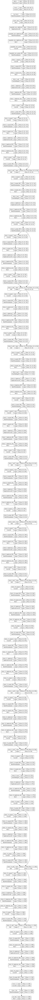

In [22]:
# Set trainable model to false

base_model.trainable = False
base_model.summary()
keras.utils.plot_model(base_model,show_shapes=True)

In [23]:
#%% 5. Define the classification layer

#Create the classifier
#Create the global average pooling layer
global_avg = layers.GlobalAveragePooling2D()

#Create an output layer
output_layer = layers.Dense(len(CLASS_NAME),activation='softmax')


In [24]:
# Use functional API to create the entire model pipeline

inputs = keras.Input(shape=IMG_SHAPE)

x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x,training=False)
x = global_avg(x)
x = layers.Dropout(0.3)(x)
outputs = output_layer(x)

model = keras.Model(inputs=inputs,outputs=outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 128, 128, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 128, 128, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_128 (Funct  (None, 4, 4, 1280)       2257984   
 ional)                                                          
                                                             

In [25]:
# Compile the model

optimizer = optimizers.Adam(learning_rate = 0.0001)
loss = losses.SparseCategoricalCrossentropy()
model.compile(optimizer=optimizer,loss=loss,metrics=['accuracy'])

In [26]:
# Evaluate before model training

loss0, acc0 = model.evaluate(test_ds)
print("Evaluation Before Training")
print("Loss =",loss0)
print("Accuracy =",acc0)

62/62 [==============================] - 56s 864ms/step - loss: 1.0067 - accuracy: 0.3412
Evaluation Before Training
Loss = 1.0067263841629028
Accuracy = 0.3412298262119293


In [28]:
#%% 6.Tensorboard callback 
%load_ext tensorboard

LOGS_PATH = os.path.join(os.getcwd(),'logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
ts_callback = TensorBoard(log_dir=LOGS_PATH)
es_callback = EarlyStopping(monitor='val_loss',patience=5,verbose=0,restore_best_weights=True)


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [35]:
#%% 7. Model training
EPOCHS = 8

history = model.fit(train_pf, validation_data=val_pf, epochs=EPOCHS, callbacks=[es_callback,ts_callback])

Epoch 1/8
500/500 [==============================] - 455s 909ms/step - loss: 0.0114 - accuracy: 0.9964 - val_loss: 0.0083 - val_accuracy: 0.9975
Epoch 2/8
500/500 [==============================] - 451s 902ms/step - loss: 0.0116 - accuracy: 0.9966 - val_loss: 0.0071 - val_accuracy: 0.9980
Epoch 3/8
500/500 [==============================] - 455s 910ms/step - loss: 0.0093 - accuracy: 0.9971 - val_loss: 0.0063 - val_accuracy: 0.9983
Epoch 4/8
500/500 [==============================] - 500s 1s/step - loss: 0.0094 - accuracy: 0.9972 - val_loss: 0.0060 - val_accuracy: 0.9985
Epoch 5/8
500/500 [==============================] - 501s 1s/step - loss: 0.0083 - accuracy: 0.9973 - val_loss: 0.0057 - val_accuracy: 0.9985
Epoch 6/8
500/500 [==============================] - 510s 1s/step - loss: 0.0074 - accuracy: 0.9977 - val_loss: 0.0053 - val_accuracy: 0.9985
Epoch 7/8
500/500 [==============================] - 491s 983ms/step - loss: 0.0071 - accuracy: 0.9977 - val_loss: 0.0050 - val_accuracy: 0

In [31]:
#%% 8. Model evaluation
# Doing prediction with model

image_batch, label_batch = test_pf.as_numpy_iterator().next()
y_pred = np.argmax(model.predict(image_batch), axis=1)

2/2 [==============================] - 3s 365ms/step


In [32]:
# Classification report
print('Classification report:\n', classification_report(label_batch, y_pred))

Classification report:
               precision    recall  f1-score   support

           0       1.00      0.96      0.98        24
           1       0.98      1.00      0.99        40

    accuracy                           0.98        64
   macro avg       0.99      0.98      0.98        64
weighted avg       0.98      0.98      0.98        64



In [33]:
# %% Model saving
# Save model
model.save(filepath=os.path.join(os.getcwd(), 'saved_model', 'model.h5'))

In [36]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 13216), started 1:14:58 ago. (Use '!kill 13216' to kill it.)

<IPython.core.display.Javascript object>